## Домашня работа 4.
## Градиентный бустинг.

Дедлайн 24 ноября в 21:00.



Максимальная оценка - 10 баллов.

Не списывайте 👒

Не бойтесь рисовать картинки и применять другие методы, даже если не просили 👒

__Задание 1. (0.5 балла)__

Мы будем использовать данные из [соревнования](https://www.kaggle.com/t/b710e05dc0bd424995ca94da5b639869). 
* Загрузите таблицу application_train.csv;
* Запишите в Y столбец с целевой переменной (TARGET);
* Удалите ненужные столбцы (для этого воспользуйтесь описанием);
* Определите тип столбцов и заполните пропуски - стратегия произвольная;
* Разбейте выборку в соотношении 70:30 с random_state=0.

Так как в данных имеется значительный дисбаланс классов, в качестве метрики качества везде будем использовать площадь под precision-recall кривой (AUC-PR).

In [1]:
from sklearn.base import BaseEstimator
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.metrics import precision_score, accuracy_score, recall_score, auc, roc_curve, roc_auc_score, precision_recall_curve
from sklearn.neighbors import KNeighborsRegressor
import pandas as pd
from scipy.stats import mode
import matplotlib.pyplot as plt
import numpy as np
from sklearn import tree
import graphviz
import mplcyberpunk
from pylab import rcParams
import seaborn as sns

plt.style.use("cyberpunk")
rcParams['figure.figsize'] = 10, 5

In [2]:
data = pd.DataFrame(pd.read_csv('application_train.csv'))
y = data.TARGET
X = data.drop(columns=["TARGET"])
X = X.replace(['F', 'M', 'N', 'Y'], [0, 1, 0, 1]) # сделаем немного больше числовых переменных
X

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,247330,Cash loans,0,0,0,0,157500.0,706410.0,67072.5,679500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,425716,Cash loans,0,1,1,1,121500.0,545040.0,25407.0,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,331625,Cash loans,1,1,1,1,225000.0,942300.0,27679.5,675000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
3,455397,Revolving loans,0,0,1,2,144000.0,180000.0,9000.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,2.0
4,449114,Cash loans,0,0,1,0,112500.0,729792.0,37390.5,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215252,239009,Cash loans,0,0,1,0,121500.0,675000.0,32602.5,675000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
215253,399937,Cash loans,0,0,0,2,225000.0,509922.0,40419.0,472500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
215254,253016,Cash loans,1,1,1,0,450000.0,1125000.0,33025.5,1125000.0,...,0,0,0,0,0.0,0.0,0.0,2.0,0.0,3.0
215255,270275,Revolving loans,1,1,1,1,180000.0,270000.0,13500.0,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0


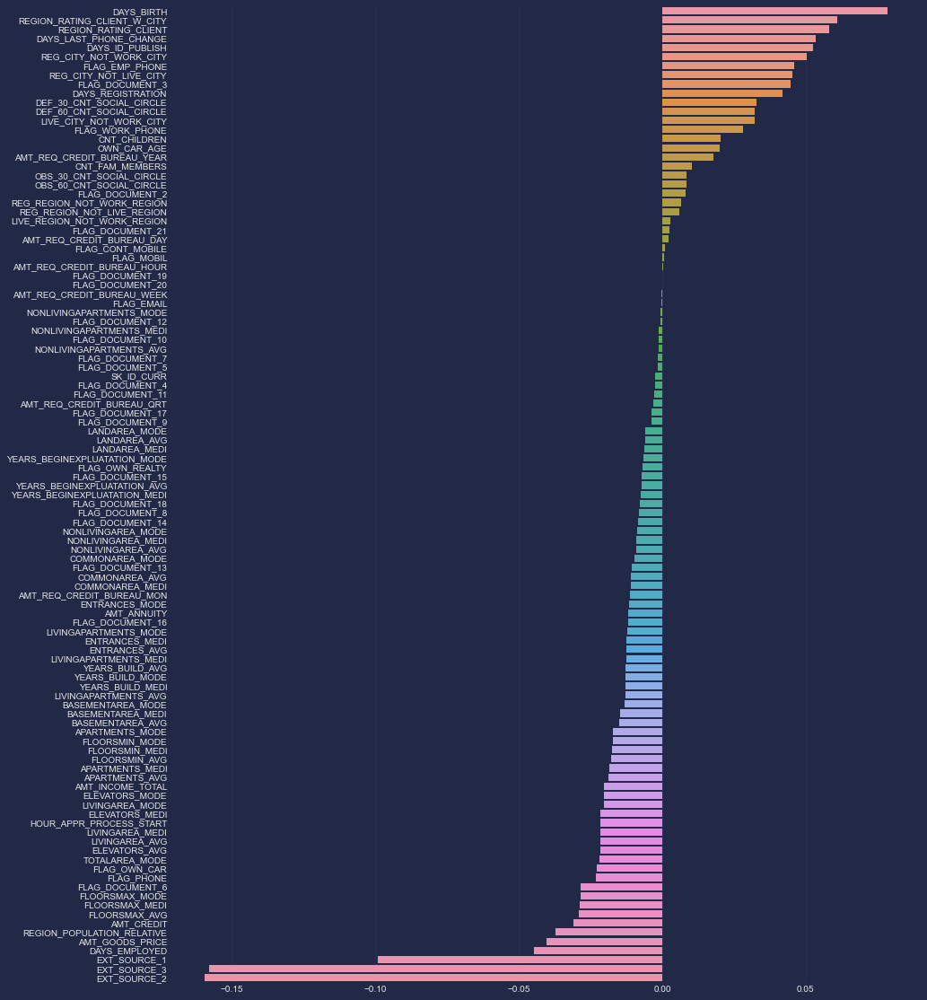

In [3]:
# заполняем пропуски если они есть и смотрим на корреляцию Пирсона чтобы понять, какие переменные можем выкинуть

numeric_data = X.select_dtypes([np.number])
numeric_data_mean = numeric_data.mean()
numeric_features = numeric_data.columns

X = X.fillna(numeric_data_mean)

correlations = X[numeric_features].corrwith(y).sort_values(ascending=False)
plot = sns.barplot(y=correlations.index, x=correlations)
plot.figure.set_size_inches(15, 20)

In [4]:
# так как корреляции очень очень низкие, большинство признаков будет только добавлять больше шума, отберем 30 признаков с наибольшим коэфициентом корреляции по модулю

name_of_min_corr = np.abs(correlations).sort_values()
X = X.drop(name_of_min_corr[:77].index, axis=1)
X 

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,AMT_CREDIT,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,...,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_6
0,Cash loans,0,0,706410.0,679500.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,...,NaN,NaN,0.070200,Panel,No,0.0,0.0,-1254.0,1,0
1,Cash loans,0,1,545040.0,450000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,...,NaN,block of flats,0.550100,"Stone, brick",No,0.0,0.0,-907.0,1,0
2,Cash loans,1,1,942300.0,675000.0,Unaccompanied,Working,Secondary / secondary special,Married,Municipal apartment,...,reg oper account,block of flats,0.671400,Panel,No,0.0,0.0,0.0,1,0
3,Revolving loans,0,0,180000.0,180000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Separated,House / apartment,...,reg oper account,block of flats,0.018000,Block,No,0.0,0.0,-394.0,0,0
4,Cash loans,0,0,729792.0,630000.0,Unaccompanied,Pensioner,Secondary / secondary special,Civil marriage,House / apartment,...,NaN,NaN,0.102684,NaN,NaN,0.0,0.0,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215252,Cash loans,0,0,675000.0,675000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,...,NaN,NaN,0.102684,NaN,NaN,0.0,0.0,-564.0,1,0
215253,Cash loans,0,0,509922.0,472500.0,"Spouse, partner",Commercial associate,Secondary / secondary special,Married,House / apartment,...,NaN,NaN,0.102684,NaN,NaN,0.0,0.0,-1063.0,1,0
215254,Cash loans,1,1,1125000.0,1125000.0,Unaccompanied,Working,Higher education,Single / not married,House / apartment,...,reg oper account,block of flats,0.237500,Panel,No,0.0,0.0,-2267.0,0,0
215255,Revolving loans,1,1,270000.0,270000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,...,reg oper account,block of flats,0.286300,"Stone, brick",No,0.0,0.0,0.0,0,0


In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

__Задание 2. (1.5 балла)__

Обучите реализации градиентного бустинга LightGBM и Catboost на вещественных признаках без подбора параметров. 
Почему получилась заметная разница в качестве? 

В этом и последующих экспериментах необходимо измерять время обучения моделей.

In [6]:
import lightgbm as lgb
import time

numeric_train = X_train.select_dtypes([np.number])
numeric_test = X_test.select_dtypes([np.number])

start_time = time.time()
model = lgb.LGBMClassifier()
model.fit(numeric_train, y_train)
predictions = model.predict(numeric_test)
probab = model.predict_proba(numeric_test)
print('Accuracy: ', accuracy_score(y_test, predictions))
print('Precision: ', precision_score(y_test, predictions))
print('Recall: ', recall_score(y_test, predictions))
print("--- %s seconds ---" % (time.time() - start_time))

Accuracy:  0.9206850630245594
Precision:  0.625
Recall:  0.014557453416149068
--- 1.5106534957885742 seconds ---


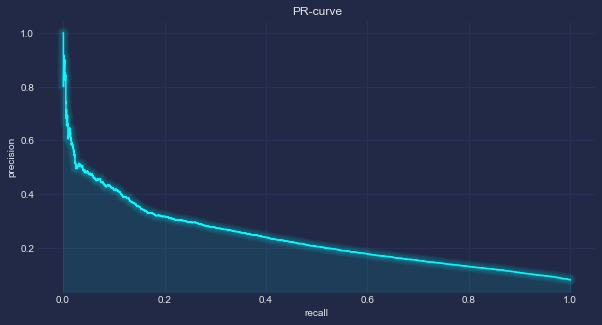

In [7]:
precision_array, recall_array, thresholds = precision_recall_curve(y_test, probab[:, 1])
plt.plot(recall_array, precision_array)
plt.title('PR-curve')
plt.xlabel('recall')
plt.ylabel('precision')
mplcyberpunk.add_glow_effects() 
plt.show()

In [8]:
print('PR-AUC, или площадь под кривой PR, равна ', auc(recall_array, precision_array))

PR-AUC, или площадь под кривой PR, равна  0.23540007362925996


In [9]:
import catboost as ctb

start_time = time.time()
model2 = ctb.CatBoostClassifier()
model2.fit(numeric_train, y_train)
predictions = model2.predict(numeric_test)
probab = model2.predict_proba(numeric_test)
print('Accuracy: ', accuracy_score(y_test, predictions))
print('Precision: ', precision_score(y_test, predictions))
print('Recall: ', recall_score(y_test, predictions))
print("--- %s seconds ---" % (time.time() - start_time))

rn: 0.2273765	total: 27.8s	remaining: 17.3s
616:	learn: 0.2273444	total: 27.8s	remaining: 17.3s
617:	learn: 0.2273133	total: 27.9s	remaining: 17.2s
618:	learn: 0.2272714	total: 27.9s	remaining: 17.2s
619:	learn: 0.2272347	total: 27.9s	remaining: 17.1s
620:	learn: 0.2271988	total: 28s	remaining: 17.1s
621:	learn: 0.2271603	total: 28s	remaining: 17s
622:	learn: 0.2271397	total: 28.1s	remaining: 17s
623:	learn: 0.2271039	total: 28.1s	remaining: 16.9s
624:	learn: 0.2270832	total: 28.1s	remaining: 16.9s
625:	learn: 0.2270370	total: 28.2s	remaining: 16.8s
626:	learn: 0.2270155	total: 28.2s	remaining: 16.8s
627:	learn: 0.2269675	total: 28.2s	remaining: 16.7s
628:	learn: 0.2269412	total: 28.3s	remaining: 16.7s
629:	learn: 0.2269072	total: 28.3s	remaining: 16.6s
630:	learn: 0.2268466	total: 28.4s	remaining: 16.6s
631:	learn: 0.2268167	total: 28.4s	remaining: 16.5s
632:	learn: 0.2267894	total: 28.5s	remaining: 16.5s
633:	learn: 0.2267497	total: 28.5s	remaining: 16.5s
634:	learn: 0.2267195	total:

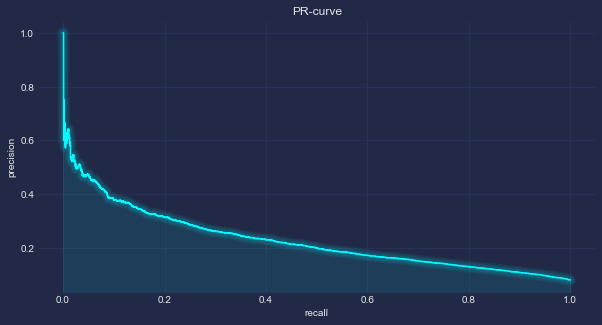

In [10]:
precision_array, recall_array, thresholds = precision_recall_curve(y_test, probab[:, 1])
plt.plot(recall_array, precision_array)
plt.title('PR-curve')
plt.xlabel('recall')
plt.ylabel('precision')
mplcyberpunk.add_glow_effects() 
plt.show()

In [11]:
print('PR-AUC, или площадь под кривой PR, равна ', auc(recall_array, precision_array))

PR-AUC, или площадь под кривой PR, равна  0.2275490967956972


**да как-то не видно особой разницы в качестве, я бы сказала что обе модели одинаково плохи :(**

__Задание 3. (2 балла)__

Подберите оптимальные с точки зрения метрики качества параметры алгоритмов, изменяя:

* количество деревьев
* темп обучения (eta / learning_rate)
* глубину деревьев

Подбирайте параметры по очереди. Сначала количество деревьев. Потом темп обучения при выбранном на предыдущем шаге количестве деревьев. Потом глубину при лучших значениях двух предыдущих параметров.

Масштаб значений можно посмотреть в [ноутбуке](https://github.com/esokolov/ml-course-hse/blob/master/2019-fall/seminars/sem10-gbm.ipynb) с семинара ФКН 👒 Да и в целом его полезно посмотреть.

Постройте графики зависимости качества двух алгоритмов от глубины, количества деревьев и темпа обучения (3 графика, по одному — на каждый гиперпараметр).

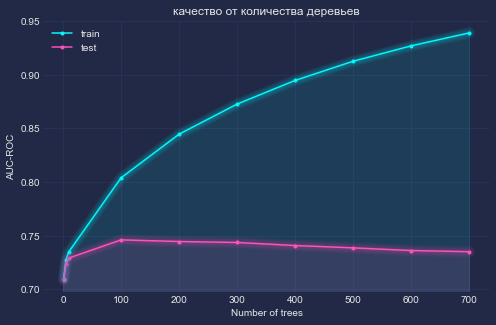

In [12]:
n_trees = [1, 5, 10, 100, 200, 300, 400, 500, 600, 700]
quals_train = []
quals_test = []
for n in n_trees:
    clf = lgb.LGBMClassifier(n_estimators=n)
    clf.fit(numeric_train, y_train)
    q_train = roc_auc_score(y_train, clf.predict_proba(numeric_train)[:, 1])
    q_test = roc_auc_score(y_test, clf.predict_proba(numeric_test)[:, 1])
    quals_train.append(q_train)
    quals_test.append(q_test)
    
plt.figure(figsize=(8, 5))
plt.plot(n_trees, quals_train, marker='.', label='train')
plt.plot(n_trees, quals_test, marker='.', label='test')
plt.xlabel('Number of trees')
plt.ylabel('AUC-ROC')
plt.legend()
plt.title('качество от количества деревьев')
mplcyberpunk.add_glow_effects() 
plt.show()

**число деревьев = 100**

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

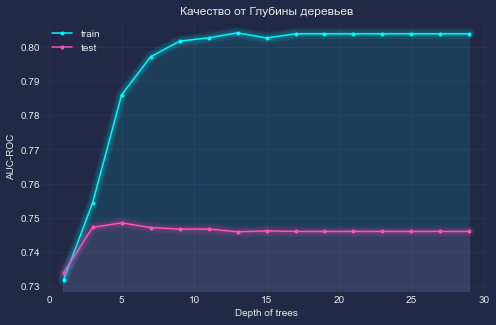

In [13]:
depth = list(range(1, 30, 2))
#n_trees = 100
quals_train = []
quals_test = []
for d in depth:
    clf = lgb.LGBMClassifier(max_depth=d)
    clf.fit(numeric_train, y_train)
    q_train = roc_auc_score(y_train, clf.predict_proba(numeric_train)[:, 1])
    q_test = roc_auc_score(y_test, clf.predict_proba(numeric_test)[:, 1])
    quals_train.append(q_train)
    quals_test.append(q_test)
    
plt.figure(figsize=(8, 5))
plt.plot(depth, quals_train, marker='.', label='train')
plt.plot(depth, quals_test, marker='.', label='test')
plt.xlabel('Depth of trees')
plt.ylabel('AUC-ROC')
plt.legend()
plt.title('Качество от Глубины деревьев')
mplcyberpunk.add_glow_effects() 
plt.show()

**глубина дерева - 5**

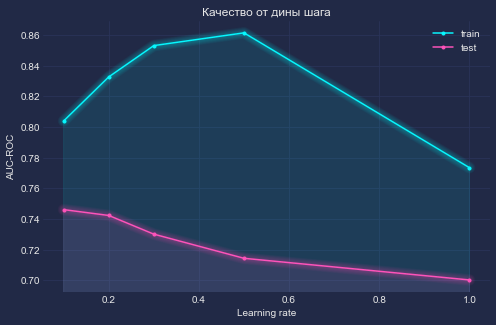

In [14]:
learning_rate = [1, 0.5, 0.3, 0.2, 0.1]

quals_train = []
quals_test = []
for eta in learning_rate:
    clf = lgb.LGBMClassifier(learning_rate = eta)
    clf.fit(numeric_train, y_train)
    q_train = roc_auc_score(y_train, clf.predict_proba(numeric_train)[:, 1])
    q_test = roc_auc_score(y_test, clf.predict_proba(numeric_test)[:, 1])
    quals_train.append(q_train)
    quals_test.append(q_test)
    
plt.figure(figsize=(8, 5))
plt.plot(learning_rate, quals_train, marker='.', label='train')
plt.plot(learning_rate, quals_test, marker='.', label='test')
plt.xlabel('Learning rate')
plt.ylabel('AUC-ROC')
plt.legend()
plt.title('Качество от дины шага')
mplcyberpunk.add_glow_effects() 
plt.show()

**оптимальный шаг на тесте - 0.1**

In [15]:
start_time = time.time()
model = lgb.LGBMClassifier(learning_rate = 0.1, max_depth = 5, n_estimators = 100)
model.fit(numeric_train, y_train)
predictions = model.predict(numeric_test)
probab = model.predict_proba(numeric_test)
print('Accuracy: ', accuracy_score(y_test, predictions))
print('Precision: ', precision_score(y_test, predictions))
print('Recall: ', recall_score(y_test, predictions))
print("--- %s seconds ---" % (time.time() - start_time))

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Accuracy:  0.9207315184737836
Precision:  0.6601941747572816
Recall:  0.013198757763975156
--- 1.5551307201385498 seconds ---


In [22]:
precision_array, recall_array, thresholds = precision_recall_curve(y_test, predictions)
print('PR-AUC, или площадь под кривой PR, равна ', auc(recall_array, precision_array))

PR-AUC, или площадь под кривой PR, равна  0.31901871280280963


__Задание 4. (3.5 балла)__

Добавьте категориальные признаки к вещественным следующими способами:

* как OHE (one-hot-encoded) признаки
* как счетчики со сглаживанием.

При подсчете счетчиков запрещается использование циклов. 

Попробуйте заново подобрать гиперпараметры. Изменились ли они?
Как меняется время, необходимое для обучения моделей, в зависимости от способа кодирования? 


In [16]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
#from sklearn.compose import ColumnTransformer
#from sklearn.pipeline import Pipeline

X_test.drop('CODE_GENDER', axis = 1, inplace = True)
X_train.drop('CODE_GENDER', axis = 1, inplace = True)
categorical = list(X_train.dtypes[X_train.dtypes == "object"].index)
X_train[categorical] = X_train[categorical].fillna("NotGiven")
X_test[categorical] = X_test[categorical].fillna("NotGiven")
X_train[categorical]

,NAME_CONTRACT_TYPE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
28668,Cash loans,Family,Working,Secondary / secondary special,Married,House / apartment,Sales staff,WEDNESDAY,Other,NotGiven,NotGiven,NotGiven,NotGiven
35005,Cash loans,Unaccompanied,Working,Higher education,Married,House / apartment,Managers,MONDAY,School,reg oper account,block of flats,Panel,No
105487,Cash loans,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,NotGiven,WEDNESDAY,XNA,NotGiven,NotGiven,NotGiven,NotGiven
84068,Cash loans,Unaccompanied,Pensioner,Secondary / secondary special,Civil marriage,House / apartment,NotGiven,TUESDAY,XNA,NotGiven,NotGiven,NotGiven,NotGiven
51787,Cash loans,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Core staff,SATURDAY,Kindergarten,NotGiven,NotGiven,NotGiven,NotGiven
...,...,...,...,...,...,...,...,...,...,...,...,...,...
176963,Cash loans,Unaccompanied,State servant,Secondary / secondary special,Married,House / apartment,NotGiven,MONDAY,Industry: type 11,reg oper account,block of flats,Panel,No
117952,Cash loans,Unaccompanied,Working,Secondary / secondary special,Separated,House / apartment,NotGiven,WEDNESDAY,Industry: type 11,reg oper account,block of flats,"Stone, brick",No
173685,Cash loans,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,NotGiven,WEDNESDAY,Business Entity Type 3,NotGiven,NotGiven,NotGiven,No
43567,Cash loans,Family,Working,Secondary / secondary special,Married,House / apartment,Security staff,MONDAY,Business Entity Type 3,NotGiven,block of flats,"Stone, brick",No


In [17]:
encoder = OneHotEncoder(handle_unknown='ignore')
# passing bridge-types-cat column (label encoded values of bridge_types)
encoded_train = pd.DataFrame(encoder.fit_transform(X_train[categorical]).toarray())
# merge with main df bridge_df on key values
encoded_train = pd.DataFrame(np.hstack((numeric_train, encoded_train)))
encoded_train

,0,1,2,3,4,5,6,7,8,9,...,158,159,160,161,162,163,164,165,166,167
0,0.0,580500.0,580500.0,0.009334,-19779.0,-186.0,-12306.0,-3101.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,1078200.0,900000.0,0.020246,-11336.0,-2762.0,-257.0,-3994.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,0.0,276277.5,238500.0,0.003122,-23289.0,365243.0,-12856.0,-4096.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,555273.0,463500.0,0.035792,-20276.0,365243.0,-10689.0,-2803.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,247275.0,225000.0,0.008068,-10520.0,-907.0,-4975.0,-849.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150674,1.0,1288350.0,1125000.0,0.072508,-18963.0,-7046.0,-892.0,-2512.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
150675,0.0,450000.0,450000.0,0.006671,-15270.0,-223.0,-4754.0,-3529.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
150676,0.0,67500.0,67500.0,0.018209,-12806.0,-3026.0,-2855.0,-2924.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
150677,1.0,781920.0,675000.0,0.015221,-19809.0,-281.0,-7007.0,-3332.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


In [18]:
encoder = OneHotEncoder(handle_unknown='ignore')
# passing bridge-types-cat column (label encoded values of bridge_types)
encoded_test = pd.DataFrame(encoder.fit_transform(X_test[categorical]).toarray())
encoded_test = pd.DataFrame(np.hstack((numeric_test, encoded_test)))
encoded_test

,0,1,2,3,4,5,6,7,8,9,...,158,159,160,161,162,163,164,165,166,167
0,0.0,790434.0,706500.0,0.009657,-19301.0,-419.0,-7974.0,-2828.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.0,900000.0,900000.0,0.046220,-11976.0,-1274.0,-832.0,-3959.0,1.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,157500.0,157500.0,0.046220,-21759.0,-1329.0,-2268.0,-3603.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.0,225000.0,225000.0,0.026392,-13174.0,-3683.0,-3680.0,-4702.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.0,1206954.0,945000.0,0.046220,-19603.0,-2545.0,-2939.0,-2933.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64573,0.0,270000.0,270000.0,0.031329,-10380.0,-921.0,-4866.0,-3042.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
64574,0.0,946764.0,765000.0,0.046220,-19921.0,-2697.0,-3394.0,-1476.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
64575,0.0,176328.0,139500.0,0.022625,-15573.0,-1741.0,-3283.0,-4747.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
64576,0.0,270000.0,270000.0,0.026392,-11734.0,-2993.0,-1125.0,-1447.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [19]:
start_time = time.time()
model = lgb.LGBMClassifier()
model.fit(encoded_train, y_train)
predictions = model.predict(encoded_test)
probab = model.predict_proba(encoded_test)
#predictions = np.where(probab[:, 1] < 0.1, 0, 1)  # тут у нас такая проблема, все probabilities меньше 0,5, соответственно на выходе у нас array из 0, поэтому я искуственно задала порог в 0.1 

print('Accuracy: ', accuracy_score(y_test, predictions))
print('Precision: ', precision_score(y_test, predictions))
print('Recall: ', recall_score(y_test, predictions))
print("--- %s seconds ---" % (time.time() - start_time))

Accuracy:  0.9207315184737836
Precision:  0.726027397260274
Recall:  0.010287267080745342
--- 3.1197943687438965 seconds ---


In [20]:
precision_array, recall_array, thresholds = precision_recall_curve(y_test, predictions)
print('PR-AUC, или площадь под кривой PR, равна ', auc(recall_array, precision_array))

PR-AUC, или площадь под кривой PR, равна  0.4076367214362039


In [21]:
start_time = time.time()
model2 = ctb.CatBoostClassifier()
model2.fit(encoded_train, y_train)
predictions = model2.predict(encoded_test)
probab = model2.predict_proba(encoded_test)

print('Accuracy: ', accuracy_score(y_test, predictions))
print('Precision: ', precision_score(y_test, predictions))
print('Recall: ', recall_score(y_test, predictions))
print("--- %s seconds ---" % (time.time() - start_time))

s
615:	learn: 0.2256276	total: 36.9s	remaining: 23s
616:	learn: 0.2255874	total: 37s	remaining: 23s
617:	learn: 0.2255436	total: 37s	remaining: 22.9s
618:	learn: 0.2255025	total: 37.1s	remaining: 22.8s
619:	learn: 0.2254795	total: 37.2s	remaining: 22.8s
620:	learn: 0.2254341	total: 37.2s	remaining: 22.7s
621:	learn: 0.2253878	total: 37.3s	remaining: 22.6s
622:	learn: 0.2253634	total: 37.3s	remaining: 22.6s
623:	learn: 0.2253274	total: 37.4s	remaining: 22.5s
624:	learn: 0.2252744	total: 37.5s	remaining: 22.5s
625:	learn: 0.2252452	total: 37.5s	remaining: 22.4s
626:	learn: 0.2252251	total: 37.6s	remaining: 22.4s
627:	learn: 0.2252119	total: 37.6s	remaining: 22.3s
628:	learn: 0.2251666	total: 37.7s	remaining: 22.2s
629:	learn: 0.2251268	total: 37.7s	remaining: 22.2s
630:	learn: 0.2250852	total: 37.8s	remaining: 22.1s
631:	learn: 0.2250410	total: 37.8s	remaining: 22s
632:	learn: 0.2250234	total: 37.9s	remaining: 22s
633:	learn: 0.2250041	total: 37.9s	remaining: 21.9s
634:	learn: 0.2249631	

In [23]:
precision_array, recall_array, thresholds = precision_recall_curve(y_test, predictions)
print('PR-AUC, или площадь под кривой PR, равна ', auc(recall_array, precision_array))

PR-AUC, или площадь под кривой PR, равна  0.31901871280280963


In [24]:
n_trees = [1, 5, 10, 100, 200, 300, 400, 500, 600, 700]
quals_train = []
quals_test = []
for n in n_trees:
    clf = lgb.LGBMClassifier(n_estimators=n)
    clf.fit(encoded_train, y_train)
    q_train = roc_auc_score(y_train, clf.predict_proba(encoded_train)[:, 1])
    q_test = roc_auc_score(y_test, clf.predict_proba(encoded_test)[:, 1])
    quals_train.append(q_train)
    quals_test.append(q_test)
    
plt.figure(figsize=(8, 5))
plt.plot(n_trees, quals_train, marker='.', label='train')
plt.plot(n_trees, quals_test, marker='.', label='test')
plt.xlabel('Number of trees')
plt.ylabel('AUC-ROC')
plt.legend()
plt.title('Количество деревьев')
mplcyberpunk.add_glow_effects() 
plt.show()

KeyboardInterrupt: 

**onehotencoding - оптимальное число деревьев = 100**

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^m

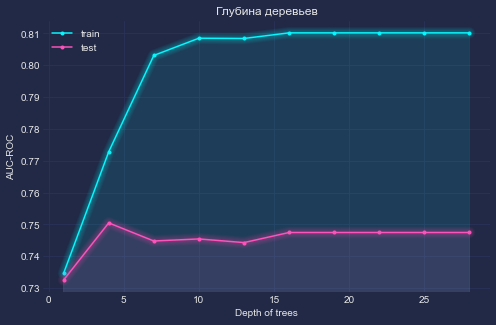

In [84]:
depth = list(range(1, 30, 3))
#n_trees = 100
quals_train = []
quals_test = []
for d in depth:
    clf = lgb.LGBMClassifier(max_depth=d)
    clf.fit(encoded_train, y_train)
    q_train = roc_auc_score(y_train, clf.predict_proba(encoded_train)[:, 1])
    q_test = roc_auc_score(y_test, clf.predict_proba(encoded_test)[:, 1])
    quals_train.append(q_train)
    quals_test.append(q_test)
    
plt.figure(figsize=(8, 5))
plt.plot(depth, quals_train, marker='.', label='train')
plt.plot(depth, quals_test, marker='.', label='test')
plt.xlabel('Depth of trees')
plt.ylabel('AUC-ROC')
plt.legend()
plt.title('Глубина деревьев')
mplcyberpunk.add_glow_effects() 
plt.show()

**а глубина дерева - 4**

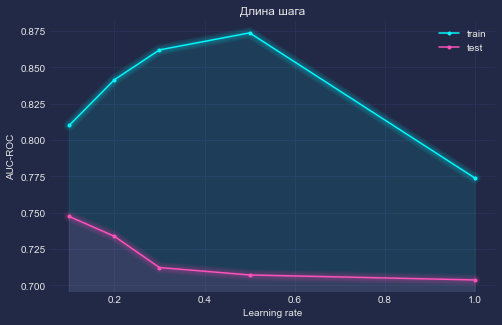

In [85]:
learning_rate = [1, 0.5, 0.3, 0.2, 0.1]

quals_train = []
quals_test = []
for eta in learning_rate:
    clf = lgb.LGBMClassifier(learning_rate = eta)
    clf.fit(encoded_train, y_train)
    q_train = roc_auc_score(y_train, clf.predict_proba(encoded_train)[:, 1])
    q_test = roc_auc_score(y_test, clf.predict_proba(encoded_test)[:, 1])
    quals_train.append(q_train)
    quals_test.append(q_test)
    
plt.figure(figsize=(8, 5))
plt.plot(learning_rate, quals_train, marker='.', label='train')
plt.plot(learning_rate, quals_test, marker='.', label='test')
plt.xlabel('Learning rate')
plt.ylabel('AUC-ROC')
plt.legend()
plt.title('Длина шага')
mplcyberpunk.add_glow_effects() 
plt.show()

In [95]:
start_time = time.time()
model = lgb.LGBMClassifier(n_estimators = 100, max_depth=4, learning_rate=0.1)
model.fit(encoded_train, y_train)
predictions = model.predict(encoded_test)
probab = model.predict_proba(encoded_test)

print('Accuracy: ', accuracy_score(y_test, predictions))
print('Precision: ', precision_score(y_test, predictions))
print('Recall: ', recall_score(y_test, predictions))
print("--- %s seconds ---" % (time.time() - start_time))

Accuracy:  0.9206076372758525
Precision:  0.8048780487804879
Recall:  0.00640527950310559
--- 2.6468989849090576 seconds ---


In [97]:
precision_array, recall_array, thresholds = precision_recall_curve(y_test, predictions)
print('PR-AUC, или площадь под кривой PR, равна ', auc(recall_array, precision_array))

PR-AUC, или площадь под кривой PR, равна  0.4452759049049049


**вывод - гиперпараметры почти не изменились, время обучения ожидаемо увеличилось, выросла площадь под precision-recall, но упало accuracy, а ещё категориальные признаки заметно улучшили качество**

__Задание 5. (1 балл)__

Реализуйте блендинг подобранных в предыдущем задании моделей (бустинги с разным кодирование признаков) и сравните качество.

In [54]:
### ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

__Задание 6. (1.5 балла)__

В задании 3 вы подобрали гиперпараметры для LightGBM и CatBoost на вещественных признаках. Визуализируйте важности признаков, посчитанные этими алгоритмами, в виде горизонтального bar-plot (отсортируйте признаки по убыванию важности, подпишите названия признаков по оси y).

Для каждого из двух алгоритмов удалите неважные признаки (обычно по bar-plot хорошо видно порог, с которого начинается "хвост" менее важных признаков) и обучите модель с теми же параметрами на получившихся данных. Сильно ли упало качество при удалении признаков?

In [109]:
start_time = time.time()
model = lgb.LGBMClassifier(n_estimators = 100, max_depth=4, learning_rate=0.1)
model.fit(encoded_train, y_train)
predictions = model.predict(encoded_test)
probab = model.predict_proba(encoded_test)

print('Accuracy: ', accuracy_score(y_test, predictions))
print('Precision: ', precision_score(y_test, predictions))
print('Recall: ', recall_score(y_test, predictions))
print("--- %s seconds ---" % (time.time() - start_time))

Accuracy:  0.9206076372758525
Precision:  0.8048780487804879
Recall:  0.00640527950310559
--- 2.7397992610931396 seconds ---


Text(0.5, 1.0, 'Какие признаки наиболее важные')

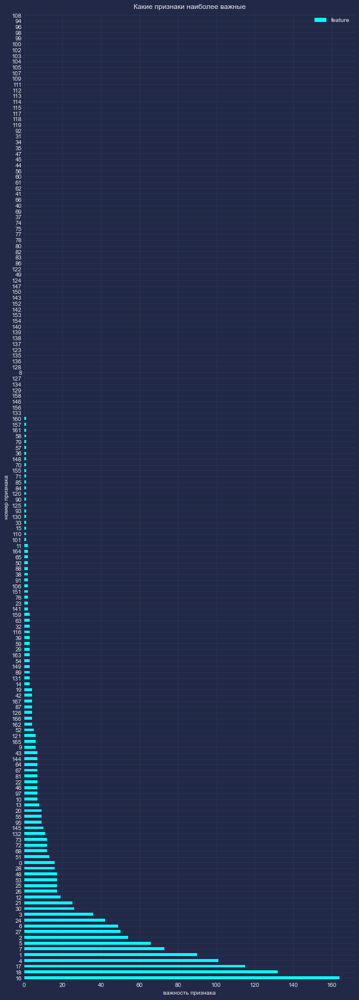

In [149]:
features = pd.DataFrame({'feature':model.feature_importances_})
features.sort_values('feature', ascending=False, inplace=True)
features.plot(kind='barh', figsize = (10, 30))
plt.xlabel('важность признака')
plt.ylabel('номер признака')
plt.title('Какие признаки наиболее важные')

In [168]:
new_data_train = encoded_train.iloc[:, [16, 17, 18, 4, 1, 7, 5, 2, 27, 6, 24, 3, 30, 21]]
new_data_test = encoded_test.iloc[:, [16, 17, 18, 4, 1, 7, 5, 2, 27, 6, 24, 3, 30, 21]]

In [169]:
start_time = time.time()
model = lgb.LGBMClassifier(n_estimators = 100, max_depth=4, learning_rate=0.1)
model.fit(new_data_train, y_train)
predictions = model.predict(new_data_test)
probab = model.predict_proba(new_data_test)

print('Accuracy: ', accuracy_score(y_test, predictions))
print('Precision: ', precision_score(y_test, predictions))
print('Recall: ', recall_score(y_test, predictions))
print("--- %s seconds ---" % (time.time() - start_time))

Accuracy:  0.9207160333240423
Precision:  0.75
Recall:  0.009316770186335404
--- 0.8485667705535889 seconds ---


In [170]:
precision_array, recall_array, thresholds = precision_recall_curve(y_test, predictions)
print('PR-AUC, или площадь под кривой PR, равна ', auc(recall_array, precision_array))

PR-AUC, или площадь под кривой PR, равна  0.4191764872332154


In [171]:
start_time = time.time()
model2 = ctb.CatBoostClassifier(n_estimators = 100, max_depth=4, learning_rate=0.1)
model2.fit(new_data_train, y_train)
predictions = model2.predict(new_data_test)
probab = model2.predict_proba(new_data_test)
print('Accuracy: ', accuracy_score(y_test, predictions))
print('Precision: ', precision_score(y_test, predictions))
print('Recall: ', recall_score(y_test, predictions))
print("--- %s seconds ---" % (time.time() - start_time))

0:	learn: 0.6261129	total: 16.3ms	remaining: 1.61s
1:	learn: 0.5712192	total: 30.8ms	remaining: 1.51s
2:	learn: 0.5258966	total: 45ms	remaining: 1.46s
3:	learn: 0.4874852	total: 59.4ms	remaining: 1.43s
4:	learn: 0.4552710	total: 75.9ms	remaining: 1.44s
5:	learn: 0.4280415	total: 91.5ms	remaining: 1.43s
6:	learn: 0.4048182	total: 106ms	remaining: 1.41s
7:	learn: 0.3847831	total: 121ms	remaining: 1.4s
8:	learn: 0.3675509	total: 136ms	remaining: 1.37s
9:	learn: 0.3529046	total: 151ms	remaining: 1.36s
10:	learn: 0.3402387	total: 168ms	remaining: 1.36s
11:	learn: 0.3291318	total: 185ms	remaining: 1.35s
12:	learn: 0.3194763	total: 204ms	remaining: 1.37s
13:	learn: 0.3112141	total: 226ms	remaining: 1.39s
14:	learn: 0.3039639	total: 241ms	remaining: 1.37s
15:	learn: 0.2978258	total: 259ms	remaining: 1.36s
16:	learn: 0.2926980	total: 275ms	remaining: 1.34s
17:	learn: 0.2879262	total: 291ms	remaining: 1.32s
18:	learn: 0.2839109	total: 306ms	remaining: 1.3s
19:	learn: 0.2803436	total: 323ms	remai

In [174]:
precision_array, recall_array, thresholds = precision_recall_curve(y_test, predictions)
print('PR-AUC, или площадь под кривой PR, равна ', auc(recall_array, precision_array))

PR-AUC, или площадь под кривой PR, равна  0.3993382581159017


**Задание 7. (0 баллов)**

Что означает cat в названии CatBoost? 👒

*категорикал, но точно не кошка*

In [56]:
# картиночка котика на радость ассистенту